# Лабораторная работа 8

Был азят датасет https://www.kaggle.com/datasets/vencerlanz09/deep-fish-object-detection

Он содержит размеченные изображения рыб на аодводных фотографиях. Обнаружение рыб на подводных снимках может позволить следить за морской фауной через дроны для её изучения и мониторинга популяции.

Метрики:

- precision

- recall

- mAP50

- mAP50-95

— являются стандартом оценки качества моделей обнаружения объектов.

Precision	измеряет, сколько ложных срабатываний делает модель
Recall показывает, сколько объектов пропущено
mAP@0.5	насколько точно модель находит объекты
mAP@0.5:0.95	учитывает как точность, так и локализацию

In [1]:
!pip install kaggle
!pip install opendatasets
!pip install pandas

In [2]:
import opendatasets as od

od.download("https://www.kaggle.com/datasets/vencerlanz09/deep-fish-object-detection")

Please provide your Kaggle credentials to download this dataset. Learn more: http://bit.ly/kaggle-creds
Your Kaggle username: xbhgbz
Your Kaggle Key: ··········
Dataset URL: https://www.kaggle.com/datasets/vencerlanz09/deep-fish-object-detection


In [4]:
!pip install torch torchvision opencv-python pyyaml tqdm matplotlib seaborn pandas ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 69.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 36.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 45.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 13.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 100.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 62.8 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstalling

# Бейзлайн

In [5]:
import os
import yaml
import shutil
from glob import glob
from ultralytics import YOLO

def prepare_dataset(base_path):
    dataset_dir = "deepfish_yolo"
    os.makedirs(dataset_dir, exist_ok=True)

    for split in ['train', 'valid']:
        os.makedirs(f"{dataset_dir}/images/{split}", exist_ok=True)
        os.makedirs(f"{dataset_dir}/labels/{split}", exist_ok=True)

        src_img_dir = f"{base_path}/{split}"
        for img_path in glob(f"{src_img_dir}/*.jpg"):
            img_name = os.path.basename(img_path)
            dst_img_path = f"{dataset_dir}/images/{split}/{img_name}"
            shutil.copy(img_path, dst_img_path)

            txt_name = img_name.replace('.jpg', '.txt')
            src_txt_path = img_path.replace('.jpg', '.txt')
            dst_txt_path = f"{dataset_dir}/labels/{split}/{txt_name}"
            if os.path.exists(src_txt_path):
                shutil.copy(src_txt_path, dst_txt_path)


    data = {
        'path': os.path.abspath(dataset_dir),
        'train': 'images/train',
        'val': 'images/valid',
        'names': {0: 'fish'},
        'nc': 1
    }

    with open(f"{dataset_dir}/data.yaml", 'w') as f:
        yaml.dump(data, f)

    return f"{dataset_dir}/data.yaml"


base_path = "deep-fish-object-detection/Deepfish/7268"
data_yaml = prepare_dataset(base_path)


Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [ ]:
model = YOLO("yolo11n.pt")
train_args_simple = {
    'data': data_yaml,
    'epochs': 50,
    'device': '0',
    'imgsz': 640
}

results = model.train(**train_args_simple)

metrics = model.val()
print("mAP@0.5-0.95: ", metrics.box.map)
print("mAP@0.5: ", metrics.box.map50)
print("Precision: ", metrics.box.mp)
print("Recall: ", metrics.box.mr)

Ultralytics 8.3.130 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=deepfish_yolo/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=50, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train2, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0, plots=True, pose=12.0, pretrained=True, 

train: Scanning /content/deepfish_yolo/labels/train.cache... 369 images, 0 backgrounds, 0 corrupt: 100%|██████████| 369/369 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 504.8±217.9 MB/s, size: 214.5 KB)


val: Scanning /content/deepfish_yolo/labels/valid.cache... 93 images, 0 backgrounds, 0 corrupt: 100%|██████████| 93/93 [00:00<?, ?it/s]


Plotting labels to runs/detect/train2/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 81 weight(decay=0.0), 88 weight(decay=0.0005), 87 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train2
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50      2.72G      2.152      2.747      1.087         12        640: 100%|██████████| 24/24 [00:10<00:00,  2.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.74it/s]

                   all         93        852     0.0224      0.734     0.0716     0.0222



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50      2.72G      1.964      1.391      1.034         36        640: 100%|██████████| 24/24 [00:08<00:00,  2.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.70it/s]

                   all         93        852     0.0195       0.64     0.0245    0.00995



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50      2.72G      1.887      1.256      1.031          9        640: 100%|██████████| 24/24 [00:07<00:00,  3.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.19it/s]

                   all         93        852      0.927      0.165      0.525        0.2



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50      2.72G      1.875      1.229      1.045          3        640: 100%|██████████| 24/24 [00:10<00:00,  2.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.18it/s]

                   all         93        852      0.728      0.543      0.668       0.25



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50      2.72G      1.834      1.113      1.012         24        640: 100%|██████████| 24/24 [00:09<00:00,  2.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.22it/s]

                   all         93        852      0.759      0.765      0.792      0.355



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50      2.72G      1.797      1.077     0.9987         29        640: 100%|██████████| 24/24 [00:08<00:00,  2.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.02it/s]

                   all         93        852      0.817       0.77      0.841        0.4



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50      2.72G      1.738      1.038     0.9917         11        640: 100%|██████████| 24/24 [00:08<00:00,  2.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.58it/s]

                   all         93        852      0.793      0.796      0.849      0.394



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50      2.72G       1.73     0.9997     0.9825         16        640: 100%|██████████| 24/24 [00:08<00:00,  2.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.42it/s]

                   all         93        852      0.842       0.82      0.869      0.406



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50      2.72G       1.72     0.9922       0.99         15        640: 100%|██████████| 24/24 [00:07<00:00,  3.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.34it/s]

                   all         93        852      0.837      0.849      0.881      0.412



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50      2.72G      1.772     0.9802     0.9872         20        640: 100%|██████████| 24/24 [00:08<00:00,  2.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.44it/s]

                   all         93        852      0.836      0.795       0.87      0.399



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50      2.72G      1.698     0.9544     0.9958          8        640: 100%|██████████| 24/24 [00:08<00:00,  2.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.20it/s]

                   all         93        852      0.832      0.825      0.881      0.423



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50      2.72G      1.728     0.9369     0.9992          9        640: 100%|██████████| 24/24 [00:08<00:00,  2.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.17it/s]

                   all         93        852      0.849      0.826      0.886      0.436



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50      2.72G      1.714      0.921     0.9851          7        640: 100%|██████████| 24/24 [00:08<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.66it/s]

                   all         93        852      0.843      0.832      0.882      0.416



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50      2.82G      1.709     0.9252     0.9836          5        640: 100%|██████████| 24/24 [00:07<00:00,  3.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.26it/s]

                   all         93        852      0.855      0.819      0.882      0.418



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50      2.82G      1.688     0.9088     0.9735          5        640: 100%|██████████| 24/24 [00:08<00:00,  2.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.40it/s]

                   all         93        852      0.847      0.836      0.895      0.443



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50      2.82G      1.744     0.9175      1.001          4        640: 100%|██████████| 24/24 [00:08<00:00,  2.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.35it/s]

                   all         93        852      0.845      0.845       0.89      0.444



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50      2.82G      1.678     0.8704     0.9849         10        640: 100%|██████████| 24/24 [00:08<00:00,  2.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.28it/s]

                   all         93        852      0.846      0.851        0.9      0.438



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50      2.82G      1.682     0.8711     0.9795          7        640: 100%|██████████| 24/24 [00:08<00:00,  2.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.88it/s]

                   all         93        852      0.865      0.841      0.905       0.44



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50      2.82G      1.664      0.877     0.9771         12        640: 100%|██████████| 24/24 [00:07<00:00,  3.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.04it/s]

                   all         93        852      0.835       0.81      0.881      0.433



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50      2.82G      1.685     0.8507     0.9685         23        640: 100%|██████████| 24/24 [00:08<00:00,  2.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.61it/s]

                   all         93        852      0.872      0.817      0.897      0.449



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50      2.82G      1.608     0.8194     0.9631         18        640: 100%|██████████| 24/24 [00:08<00:00,  2.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.47it/s]

                   all         93        852      0.872      0.808      0.888      0.447



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50      2.82G       1.66     0.8329     0.9726         15        640: 100%|██████████| 24/24 [00:08<00:00,  2.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.37it/s]

                   all         93        852      0.888      0.845      0.915      0.459



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50      2.82G      1.668     0.8444     0.9794         12        640: 100%|██████████| 24/24 [00:08<00:00,  2.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.88it/s]

                   all         93        852      0.881      0.836      0.904      0.459



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50      2.82G      1.636     0.8315     0.9602          5        640: 100%|██████████| 24/24 [00:07<00:00,  3.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.22it/s]

                   all         93        852      0.869      0.844      0.903      0.451



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50      2.82G      1.653     0.8116     0.9866         13        640: 100%|██████████| 24/24 [00:08<00:00,  2.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.54it/s]

                   all         93        852       0.88      0.844      0.917      0.469



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50      2.82G      1.592     0.8035     0.9543         13        640: 100%|██████████| 24/24 [00:08<00:00,  2.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.78it/s]

                   all         93        852      0.876      0.873      0.922      0.464



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50      2.82G      1.602     0.7851     0.9434         29        640: 100%|██████████| 24/24 [00:08<00:00,  2.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.45it/s]

                   all         93        852       0.87      0.876      0.919      0.464



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50      2.82G      1.568     0.7707     0.9588          7        640: 100%|██████████| 24/24 [00:08<00:00,  2.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.23it/s]

                   all         93        852      0.866      0.878      0.918      0.461



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/50      2.82G      1.605     0.7859     0.9593         21        640: 100%|██████████| 24/24 [00:07<00:00,  3.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.85it/s]

                   all         93        852      0.839      0.858      0.906      0.467



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/50      2.82G      1.616     0.7941     0.9684         22        640: 100%|██████████| 24/24 [00:08<00:00,  2.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.82it/s]

                   all         93        852      0.873      0.854      0.916      0.474



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/50      2.82G      1.612     0.7745     0.9478         29        640: 100%|██████████| 24/24 [00:09<00:00,  2.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.45it/s]

                   all         93        852      0.867      0.871      0.909      0.466



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/50      2.82G      1.593      0.793     0.9488          5        640: 100%|██████████| 24/24 [00:08<00:00,  2.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.45it/s]

                   all         93        852      0.893      0.858      0.927      0.474



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/50      2.82G      1.558     0.7646      0.945         21        640: 100%|██████████| 24/24 [00:08<00:00,  2.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.53it/s]

                   all         93        852      0.862      0.867      0.916      0.474



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/50      2.82G      1.596     0.7661     0.9713         30        640: 100%|██████████| 24/24 [00:07<00:00,  3.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.78it/s]

                   all         93        852      0.865      0.842      0.907      0.473



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/50      2.82G      1.567     0.7519      0.951         34        640: 100%|██████████| 24/24 [00:07<00:00,  3.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.47it/s]

                   all         93        852      0.896      0.853      0.923      0.477



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/50      2.82G      1.577     0.7572     0.9449         24        640: 100%|██████████| 24/24 [00:08<00:00,  2.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.13it/s]

                   all         93        852       0.89      0.851      0.917      0.468



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/50      2.82G       1.59     0.7528     0.9558          5        640: 100%|██████████| 24/24 [00:08<00:00,  2.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.64it/s]

                   all         93        852      0.892      0.853      0.919      0.467



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/50      2.82G      1.569     0.7545      0.955         11        640: 100%|██████████| 24/24 [00:08<00:00,  2.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.51it/s]

                   all         93        852      0.907      0.859      0.927      0.476



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/50      2.82G      1.547     0.7325     0.9463         29        640: 100%|██████████| 24/24 [00:07<00:00,  3.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.50it/s]

                   all         93        852      0.887      0.882      0.931      0.489



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/50      2.82G      1.532     0.7323     0.9389          7        640: 100%|██████████| 24/24 [00:07<00:00,  3.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.23it/s]

                   all         93        852      0.862      0.894      0.933       0.49


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/50      2.82G      1.552     0.7551     0.9735          7        640: 100%|██████████| 24/24 [00:10<00:00,  2.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.76it/s]

                   all         93        852       0.88      0.873      0.932      0.483



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/50      2.82G      1.632     0.7844     0.9707         11        640: 100%|██████████| 24/24 [00:08<00:00,  2.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.43it/s]

                   all         93        852      0.864      0.873       0.92       0.47



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/50      2.82G      1.524     0.7316      0.961         11        640: 100%|██████████| 24/24 [00:08<00:00,  2.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.29it/s]

                   all         93        852      0.891      0.866      0.933       0.49



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/50      2.82G      1.513      0.717     0.9663          5        640: 100%|██████████| 24/24 [00:08<00:00,  2.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.45it/s]

                   all         93        852      0.872      0.892      0.937      0.484



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/50      2.82G      1.509     0.7113     0.9588         10        640: 100%|██████████| 24/24 [00:07<00:00,  3.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.44it/s]

                   all         93        852      0.871      0.897      0.933      0.493



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/50      2.82G      1.499      0.703     0.9531          7        640: 100%|██████████| 24/24 [00:07<00:00,  3.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.78it/s]

                   all         93        852      0.881      0.885      0.935      0.493



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/50      2.82G      1.479     0.7071     0.9422          7        640: 100%|██████████| 24/24 [00:08<00:00,  2.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.57it/s]

                   all         93        852      0.891      0.881      0.941      0.496



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/50      2.82G      1.484     0.6899     0.9539          9        640: 100%|██████████| 24/24 [00:08<00:00,  2.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.41it/s]

                   all         93        852      0.871      0.912      0.943      0.497



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/50      2.82G      1.484     0.6903     0.9529          6        640: 100%|██████████| 24/24 [00:08<00:00,  2.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.49it/s]

                   all         93        852      0.865      0.913      0.938      0.498



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/50      2.82G      1.459     0.6746     0.9484         10        640: 100%|██████████| 24/24 [00:07<00:00,  3.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.81it/s]

                   all         93        852      0.866      0.906      0.944      0.499



50 epochs completed in 0.147 hours.
Optimizer stripped from runs/detect/train2/weights/last.pt, 5.4MB
Optimizer stripped from runs/detect/train2/weights/best.pt, 5.4MB

Validating runs/detect/train2/weights/best.pt...
Ultralytics 8.3.130 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLO11n summary (fused): 100 layers, 2,582,347 parameters, 0 gradients, 6.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.56it/s]


                   all         93        852      0.862      0.906      0.943      0.498
Speed: 0.1ms preprocess, 2.8ms inference, 0.0ms loss, 3.5ms postprocess per image
Results saved to runs/detect/train2
Ultralytics 8.3.130 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLO11n summary (fused): 100 layers, 2,582,347 parameters, 0 gradients, 6.3 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 3422.2±620.7 MB/s, size: 229.5 KB)


val: Scanning /content/deepfish_yolo/labels/valid.cache... 93 images, 0 backgrounds, 0 corrupt: 100%|██████████| 93/93 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.94it/s]


                   all         93        852      0.871      0.906      0.946      0.501
Speed: 3.0ms preprocess, 6.3ms inference, 0.0ms loss, 3.0ms postprocess per image
Results saved to runs/detect/train22
mAP@0.5-0.95:  0.5008420623945544
mAP@0.5:  0.9459947119979175
Precision:  0.8706875151850164
Recall:  0.9061032863849765



image 1/1 /content/deepfish_yolo/images/train/7268_F1_f000240.jpg: 384x640 10 fishs, 82.1ms
Speed: 4.3ms preprocess, 82.1ms inference, 2.8ms postprocess per image at shape (1, 3, 384, 640)


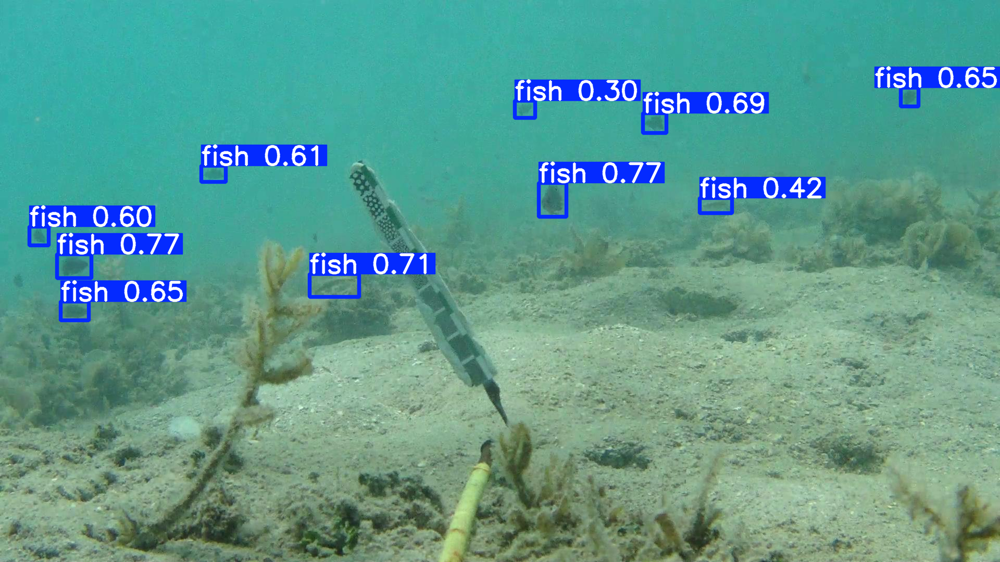

In [ ]:
results = model('deepfish_yolo/images/train/7268_F1_f000240.jpg')
results[0].show()


image 1/1 /content/deepfish_yolo/images/train/7268_F1_f000700.jpg: 384x640 9 fishs, 34.8ms
Speed: 11.6ms preprocess, 34.8ms inference, 2.1ms postprocess per image at shape (1, 3, 384, 640)


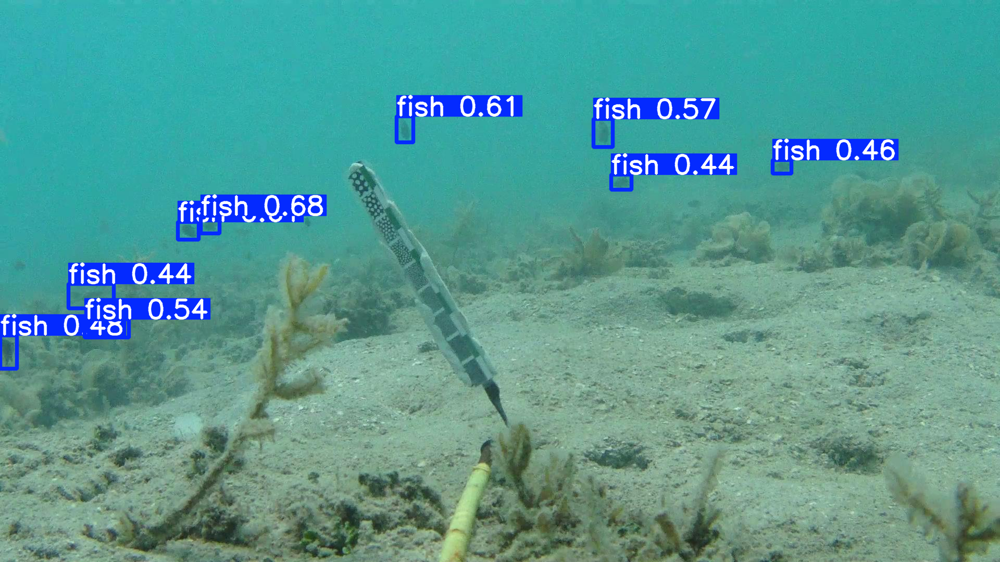

In [ ]:
results = model('deepfish_yolo/images/train/7268_F1_f000700.jpg')
results[0].show()

# Улучшение бейзлайна

Попробуем улучшить бейзлайн путём подбора гиперпараметров

In [6]:
train_args = {
    'data': data_yaml,
    'epochs': 50,
    'device': '0',
    'imgsz': 640,

    'optimizer':'AdamW',

    'lr0':2e-4,
    'weight_decay':0.05,
    'momentum':0.9,

    'cos_lr':True,
    'lrf':0.01,
    'warmup_epochs':5
}
model = YOLO("yolo11n.pt")

results = model.train(**train_args)

metrics = model.val()
print("mAP@0.5-0.95: ", metrics.box.map)
print("mAP@0.5: ", metrics.box.map50)
print("Precision: ", metrics.box.mp)
print("Recall: ", metrics.box.mr)

100%|██████████| 5.35M/5.35M [00:00<00:00, 159MB/s]


Ultralytics 8.3.130 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=True, cutmix=0.0, data=deepfish_yolo/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=50, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.0002, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11n.pt, momentum=0.9, mosaic=1.0, multi_scale=False, name=train, nbs=64, nms=False, opset=None, optimize=False, optimizer=AdamW, overlap_mask=True, patience=100, perspective=0.0, plots=True, pose=12.0, pretrained=True, p

100%|██████████| 755k/755k [00:00<00:00, 39.0MB/s]

Overriding model.yaml nc=80 with nc=1

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      6640  ultralytics.nn.modules.block.C3k2            [32, 64, 1, False, 0.25]      
  3                  -1  1     36992  ultralytics.nn.modules.conv.Conv             [64, 64, 3, 2]                
  4                  -1  1     26080  ultralytics.nn.modules.block.C3k2            [64, 128, 1, False, 0.25]     
  5                  -1  1    147712  ultralytics.nn.modules.conv.Conv             [128, 128, 3, 2]              
  6                  -1  1     87040  ultralytics.nn.modules.block.C3k2            [128, 128, 1, True]           
  7                  -1  1    295424  ultralytics

 12             [-1, 6]  1         0  ultralytics.nn.modules.conv.Concat           [1]                           
 13                  -1  1    111296  ultralytics.nn.modules.block.C3k2            [384, 128, 1, False]          
 14                  -1  1         0  torch.nn.modules.upsampling.Upsample         [None, 2, 'nearest']          
 15             [-1, 4]  1         0  ultralytics.nn.modules.conv.Concat           [1]                           
 16                  -1  1     32096  ultralytics.nn.modules.block.C3k2            [256, 64, 1, False]           
 17                  -1  1     36992  ultralytics.nn.modules.conv.Conv             [64, 64, 3, 2]                
 18            [-1, 13]  1         0  ultralytics.nn.modules.conv.Concat           [1]                           
 19                  -1  1     86720  ultralytics.nn.modules.block.C3k2            [192, 128, 1, False]          
 20                  -1  1    147712  ultralytics.nn.modules.conv.Conv             [128,

train: Scanning /content/deepfish_yolo/labels/train... 369 images, 0 backgrounds, 0 corrupt: 100%|██████████| 369/369 [00:00<00:00, 1999.45it/s]

train: New cache created: /content/deepfish_yolo/labels/train.cache


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1602.8±1109.8 MB/s, size: 214.5 KB)


val: Scanning /content/deepfish_yolo/labels/valid... 93 images, 0 backgrounds, 0 corrupt: 100%|██████████| 93/93 [00:00<00:00, 1288.80it/s]

val: New cache created: /content/deepfish_yolo/labels/valid.cache


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: AdamW(lr=0.0002, momentum=0.9) with parameter groups 81 weight(decay=0.0), 88 weight(decay=0.05), 87 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50      2.51G      2.119      2.516      1.119         12        640: 100%|██████████| 24/24 [00:11<00:00,  2.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:03<00:00,  1.06s/it]

                   all         93        852     0.0133      0.434      0.278      0.089



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50      2.53G      1.898      1.317      1.048         36        640: 100%|██████████| 24/24 [00:09<00:00,  2.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.46it/s]

                   all         93        852      0.965      0.259      0.612      0.345



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50      2.54G      1.858      1.115       1.04          9        640: 100%|██████████| 24/24 [00:07<00:00,  3.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.38it/s]

                   all         93        852      0.768      0.695      0.755      0.376



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50      2.55G      1.829      1.084      1.049          3        640: 100%|██████████| 24/24 [00:09<00:00,  2.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.28it/s]

                   all         93        852      0.337      0.903      0.806      0.379



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50      2.57G      1.794          1      1.005         24        640: 100%|██████████| 24/24 [00:10<00:00,  2.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.11it/s]

                   all         93        852      0.905      0.684      0.863      0.418



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50      2.58G      1.744     0.9728     0.9966         29        640: 100%|██████████| 24/24 [00:09<00:00,  2.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.26it/s]

                   all         93        852      0.855      0.785       0.87      0.422



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50      2.59G      1.712     0.9558     0.9869         11        640: 100%|██████████| 24/24 [00:09<00:00,  2.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.13it/s]

                   all         93        852      0.852        0.8      0.878      0.423



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50      2.61G      1.713     0.9327     0.9849         16        640: 100%|██████████| 24/24 [00:08<00:00,  2.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.49it/s]

                   all         93        852      0.813      0.829      0.878      0.434



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50      2.62G      1.702     0.9306     0.9882         15        640: 100%|██████████| 24/24 [00:07<00:00,  3.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.40it/s]

                   all         93        852      0.844      0.822      0.886      0.444



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50      2.64G      1.701     0.9192     0.9725         20        640: 100%|██████████| 24/24 [00:08<00:00,  2.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.71it/s]

                   all         93        852       0.83      0.846      0.894      0.438



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50      2.65G      1.695     0.9193     0.9952          8        640: 100%|██████████| 24/24 [00:08<00:00,  2.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.24it/s]

                   all         93        852      0.834      0.844      0.889      0.443



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50      2.67G      1.718     0.9102     0.9921          9        640: 100%|██████████| 24/24 [00:09<00:00,  2.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.20it/s]

                   all         93        852      0.819      0.855        0.9      0.448



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50      2.68G      1.691     0.8974     0.9797          7        640: 100%|██████████| 24/24 [00:08<00:00,  2.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.07it/s]

                   all         93        852      0.871      0.825      0.895      0.449



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50      2.79G      1.649     0.8879     0.9723          5        640: 100%|██████████| 24/24 [00:08<00:00,  2.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.62it/s]

                   all         93        852      0.853      0.841      0.901      0.449



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50      2.81G       1.64     0.8661     0.9634          5        640: 100%|██████████| 24/24 [00:07<00:00,  3.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.96it/s]

                   all         93        852      0.838      0.858      0.904      0.449



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50      2.82G      1.705     0.8831     0.9909          4        640: 100%|██████████| 24/24 [00:08<00:00,  2.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.41it/s]

                   all         93        852      0.879      0.842      0.908      0.455



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50      2.84G      1.641     0.8562     0.9765         10        640: 100%|██████████| 24/24 [00:08<00:00,  2.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.46it/s]

                   all         93        852      0.873       0.83        0.9      0.446



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50      2.86G      1.637     0.8486     0.9714          7        640: 100%|██████████| 24/24 [00:09<00:00,  2.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.29it/s]

                   all         93        852      0.871       0.84      0.914      0.469



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50      2.87G       1.63      0.857     0.9693         12        640: 100%|██████████| 24/24 [00:08<00:00,  2.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.67it/s]

                   all         93        852      0.839      0.886      0.917      0.466



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50      2.89G      1.641     0.8363     0.9609         23        640: 100%|██████████| 24/24 [00:07<00:00,  3.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.55it/s]

                   all         93        852      0.882      0.862      0.925      0.466



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50       2.9G      1.607     0.8293     0.9628         18        640: 100%|██████████| 24/24 [00:08<00:00,  2.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.17it/s]

                   all         93        852      0.879       0.85      0.916      0.465



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50      2.92G      1.652     0.8383     0.9722         15        640: 100%|██████████| 24/24 [00:09<00:00,  2.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.39it/s]

                   all         93        852       0.86      0.879      0.921      0.471



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50      2.93G      1.633     0.8337     0.9748         12        640: 100%|██████████| 24/24 [00:09<00:00,  2.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.20it/s]

                   all         93        852      0.855      0.872      0.922      0.463



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50      2.94G      1.611     0.8505      0.957          5        640: 100%|██████████| 24/24 [00:09<00:00,  2.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.40it/s]

                   all         93        852      0.881      0.857       0.92      0.468



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50      2.96G      1.625     0.8234     0.9842         13        640: 100%|██████████| 24/24 [00:09<00:00,  2.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.79it/s]

                   all         93        852      0.897      0.859      0.924       0.47



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50      2.97G      1.583      0.804     0.9549         13        640: 100%|██████████| 24/24 [00:08<00:00,  2.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.41it/s]

                   all         93        852      0.896      0.862      0.923      0.467



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50      2.99G        1.6     0.8135      0.942         29        640: 100%|██████████| 24/24 [00:08<00:00,  2.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.12it/s]

                   all         93        852      0.886      0.863       0.92      0.471



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50         3G       1.57     0.7961     0.9569          7        640: 100%|██████████| 24/24 [00:08<00:00,  2.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.36it/s]

                   all         93        852      0.876      0.863      0.921      0.467



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/50      3.02G      1.603      0.804     0.9569         21        640: 100%|██████████| 24/24 [00:09<00:00,  2.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.07it/s]

                   all         93        852      0.881      0.866      0.925      0.475



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/50      3.04G      1.611     0.8021     0.9668         22        640: 100%|██████████| 24/24 [00:09<00:00,  2.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.42it/s]

                   all         93        852      0.889      0.864      0.931      0.473



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/50      3.05G      1.599     0.7918     0.9425         29        640: 100%|██████████| 24/24 [00:09<00:00,  2.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.04it/s]

                   all         93        852      0.892      0.851      0.925      0.471



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/50      3.06G      1.604     0.8246     0.9488          5        640: 100%|██████████| 24/24 [00:07<00:00,  3.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.60it/s]

                   all         93        852      0.869      0.887      0.932      0.471



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/50      3.08G      1.571     0.7963     0.9492         21        640: 100%|██████████| 24/24 [00:07<00:00,  3.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.52it/s]

                   all         93        852      0.874      0.887      0.933      0.477



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/50       3.1G      1.586     0.7971     0.9651         30        640: 100%|██████████| 24/24 [00:08<00:00,  2.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.10it/s]

                   all         93        852      0.868      0.877      0.928      0.475



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/50      3.11G      1.585     0.7879     0.9524         34        640: 100%|██████████| 24/24 [00:08<00:00,  2.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.43it/s]

                   all         93        852      0.866      0.875      0.927      0.478



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/50      3.12G      1.592     0.7967      0.949         24        640: 100%|██████████| 24/24 [00:09<00:00,  2.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.62it/s]

                   all         93        852      0.895      0.864       0.93       0.48



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/50      3.13G      1.602     0.7871     0.9571          5        640: 100%|██████████| 24/24 [00:08<00:00,  2.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.47it/s]

                   all         93        852      0.885      0.867      0.929       0.48



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/50      3.15G      1.582     0.7923     0.9571         11        640: 100%|██████████| 24/24 [00:08<00:00,  2.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.82it/s]

                   all         93        852      0.878       0.88       0.93      0.482



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/50      3.17G      1.564     0.7687     0.9527         29        640: 100%|██████████| 24/24 [00:08<00:00,  2.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.73it/s]

                   all         93        852      0.883      0.876      0.931      0.477



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/50      3.18G      1.561     0.7765     0.9442          7        640: 100%|██████████| 24/24 [00:08<00:00,  2.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.61it/s]

                   all         93        852      0.867      0.891      0.933       0.48


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/50       3.2G      1.573     0.8668     0.9855          7        640: 100%|██████████| 24/24 [00:10<00:00,  2.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.47it/s]

                   all         93        852      0.876       0.87      0.925      0.466



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/50      3.21G      1.636     0.9108      0.976         11        640: 100%|██████████| 24/24 [00:08<00:00,  2.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.56it/s]

                   all         93        852      0.874      0.873      0.922      0.471



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/50      3.22G      1.522     0.7906     0.9616         11        640: 100%|██████████| 24/24 [00:08<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.42it/s]

                   all         93        852      0.884      0.866      0.924      0.474



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/50      3.24G       1.53     0.7803     0.9686          5        640: 100%|██████████| 24/24 [00:07<00:00,  3.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.11it/s]

                   all         93        852      0.894      0.866      0.923       0.47



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/50      3.25G      1.538     0.7753     0.9683         10        640: 100%|██████████| 24/24 [00:08<00:00,  2.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.36it/s]

                   all         93        852      0.882      0.871      0.923      0.468



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/50      3.27G      1.542     0.7716     0.9625          7        640: 100%|██████████| 24/24 [00:08<00:00,  2.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.77it/s]

                   all         93        852       0.88      0.873      0.923       0.47



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/50      3.28G      1.513     0.7893      0.954          7        640: 100%|██████████| 24/24 [00:08<00:00,  2.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.26it/s]

                   all         93        852      0.888      0.882      0.928      0.471



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/50       3.3G      1.513     0.7635      0.962          9        640: 100%|██████████| 24/24 [00:07<00:00,  3.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.28it/s]

                   all         93        852      0.889      0.875      0.927      0.471



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/50      3.31G       1.54     0.7735     0.9688          6        640: 100%|██████████| 24/24 [00:07<00:00,  3.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.38it/s]

                   all         93        852      0.892      0.879      0.928      0.472



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/50      3.33G      1.541     0.7703     0.9674         10        640: 100%|██████████| 24/24 [00:08<00:00,  2.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.52it/s]

                   all         93        852      0.891      0.878      0.928      0.473



50 epochs completed in 0.152 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 5.4MB
Optimizer stripped from runs/detect/train/weights/best.pt, 5.4MB

Validating runs/detect/train/weights/best.pt...
Ultralytics 8.3.130 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLO11n summary (fused): 100 layers, 2,582,347 parameters, 0 gradients, 6.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.33it/s]


                   all         93        852      0.878       0.88       0.93      0.481
Speed: 0.2ms preprocess, 2.1ms inference, 0.0ms loss, 3.7ms postprocess per image
Results saved to runs/detect/train
Ultralytics 8.3.130 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLO11n summary (fused): 100 layers, 2,582,347 parameters, 0 gradients, 6.3 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 3847.3±795.0 MB/s, size: 229.5 KB)


val: Scanning /content/deepfish_yolo/labels/valid.cache... 93 images, 0 backgrounds, 0 corrupt: 100%|██████████| 93/93 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.80it/s]


                   all         93        852      0.878       0.88      0.931      0.482
Speed: 3.5ms preprocess, 6.7ms inference, 0.0ms loss, 2.2ms postprocess per image
Results saved to runs/detect/train2
mAP@0.5-0.95:  0.48242169954170333
mAP@0.5:  0.9312729095599996
Precision:  0.8783090447097258
Recall:  0.8802816901408451



image 1/1 /content/deepfish_yolo/images/train/7268_F1_f000240.jpg: 384x640 10 fishs, 77.3ms
Speed: 6.7ms preprocess, 77.3ms inference, 2.9ms postprocess per image at shape (1, 3, 384, 640)


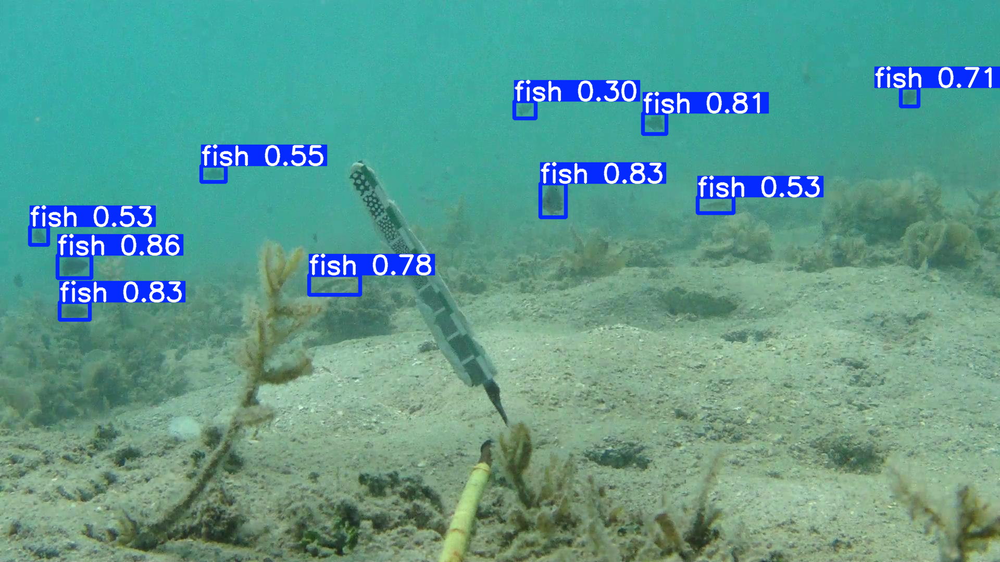

In [7]:
results = model('deepfish_yolo/images/train/7268_F1_f000240.jpg')
results[0].show()


image 1/1 /content/deepfish_yolo/images/train/7268_F1_f000700.jpg: 384x640 9 fishs, 9.4ms
Speed: 2.4ms preprocess, 9.4ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)


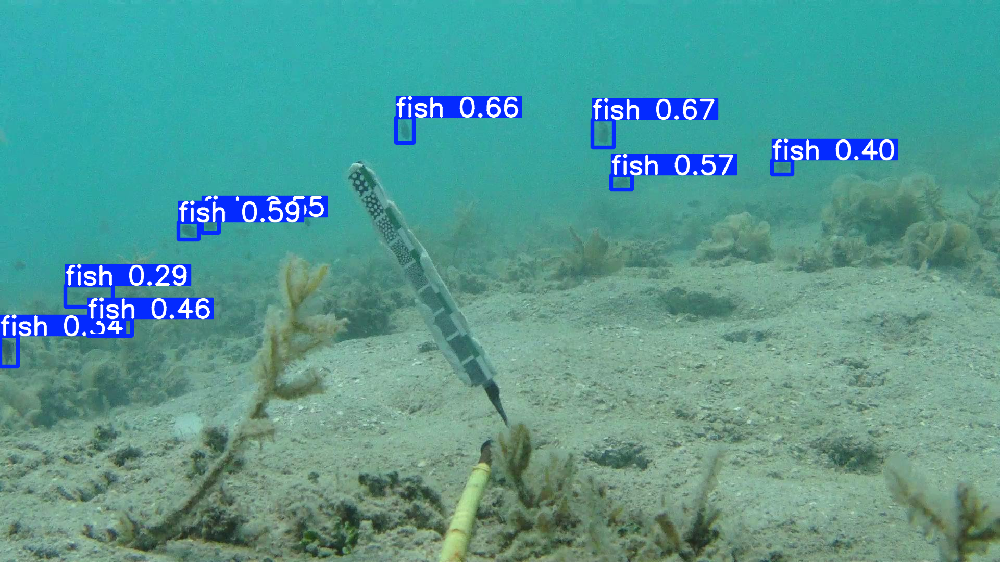

In [8]:
results = model('deepfish_yolo/images/train/7268_F1_f000700.jpg')
results[0].show()

С помощью подборов гиперпараметров и смены оптимизатора удалось увеличить точность (Precision). Остальные метрики слегка ухудшились. В прочем, если рассматривать уверенность модели в некоторых объектах на бейзлайне и на улучшенном бейзлайне, то на улучшенном бейзлайне модель даёт большую вероятность на существующих объектах.

В общем можно сказать, что заметно улучшить бейзлайн с помощью подбора гиперпараметров не получилось.

# 4 Имплементация алгоритмов машинного обучения

In [36]:
import os
import torch
from torch.utils.data import Dataset
from PIL import Image
import torchvision.transforms as T
import torch
import torch.nn as nn
from torch import optim
from torch.utils.data import DataLoader

class MYYOLO(nn.Module):
    def __init__(self, S=13, B=2, C=1):
        super(MYYOLO, self).__init__()
        self.S = S
        self.B = B
        self.C = C
        self.out_dim = (C + B * 5)

        self.features = nn.Sequential(
            nn.Conv2d(3, 32, kernel_size=3, padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(),
            nn.MaxPool2d(2),

            nn.Conv2d(32, 64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.MaxPool2d(2),

            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(),

            nn.Conv2d(128, 128, kernel_size=3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.MaxPool2d(2),

            nn.Conv2d(128, 256, kernel_size=3, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(),
            nn.MaxPool2d(2),

            nn.Conv2d(256, 512, kernel_size=3, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU(),
            nn.MaxPool2d(1),
        )

        self.pred = nn.Sequential(
            nn.Conv2d(512, 1024, kernel_size=3, padding=1),
            nn.BatchNorm2d(1024),
            nn.ReLU(),

            nn.Conv2d(1024, self.out_dim, kernel_size=1),
        )

    def forward(self, x):
        x = self.features(x)
        x = self.pred(x)
        x = x.permute(0, 2, 3, 1)
        return x

class YoloDataset(Dataset):
    def __init__(self, image_dir, label_dir, S=7, B=2, C=1, img_size=224):
        self.image_dir = image_dir
        self.label_dir = label_dir
        self.S = S
        self.B = B
        self.C = C
        self.img_size = img_size
        self.transform = T.Compose([
            T.Resize((img_size, img_size)),
            T.ToTensor(),
        ])
        self.filenames = [f for f in os.listdir(image_dir) if f.endswith(".jpg")]

    def __len__(self):
        return len(self.filenames)

    def __getitem__(self, idx):
        img_name = self.filenames[idx]
        img_path = os.path.join(self.image_dir, img_name)
        label_path = os.path.join(self.label_dir, img_name.replace(".jpg", ".txt"))
        image = Image.open(img_path).convert("RGB")
        image = self.transform(image)

        target = torch.zeros((self.S, self.S, self.C + self.B * 5))
        if os.path.exists(label_path):
            with open(label_path) as f:
                for line in f:
                    cls, x, y, w, h = map(float, line.split())
                    i, j = int(y * self.S), int(x * self.S)
                    x_cell, y_cell = x * self.S - j, y * self.S - i
                    w_cell, h_cell = w, h
                    target[i, j, 0] = 1
                    target[i, j, 1:5] = torch.tensor([x_cell, y_cell, w_cell, h_cell])
                    target[i, j, 5] = 1
                    target[i, j, 6:10] = torch.tensor([x_cell, y_cell, w_cell, h_cell])
                    target[i, j, 10] = cls
        return image, target

class YOLOLoss(nn.Module):
    def __init__(self, S=7, B=2, C=1, lambda_coord=5, lambda_noobj=0.5):
        super(YOLOLoss, self).__init__()
        self.S = S
        self.B = B
        self.C = C
        self.lambda_coord = lambda_coord
        self.lambda_noobj = lambda_noobj
        self.mse = nn.MSELoss(reduction='sum')

    def forward(self, preds, target):
        N = preds.shape[0]
        preds = preds.view(N, self.S, self.S, self.C + self.B * 5)

        pred_conf1 = preds[..., 0]
        pred_box1 = preds[..., 1:5]
        pred_conf2 = preds[..., 5]
        pred_box2 = preds[..., 6:10]
        pred_cls = preds[..., 10:]

        obj_mask = target[..., 0] > 0
        noobj_mask = ~obj_mask

        box_target = target[..., 1:5]
        box2_target = target[..., 6:10]
        cls_target = target[..., 10:]

        coord_loss = self.mse(
            pred_box1[obj_mask],
            box_target[obj_mask]
        ) + self.mse(
            pred_box2[obj_mask],
            box2_target[obj_mask]
        )

        conf_loss_obj = self.mse(pred_conf1[obj_mask], torch.ones_like(pred_conf1[obj_mask]))
        conf_loss_noobj = self.mse(pred_conf1[noobj_mask], torch.zeros_like(pred_conf1[noobj_mask]))  + self.mse(pred_conf2[noobj_mask], torch.zeros_like(pred_conf2[noobj_mask]))

        class_loss = self.mse(pred_cls[obj_mask], cls_target[obj_mask])
        total_loss = (self.lambda_coord * coord_loss + conf_loss_obj + self.lambda_noobj * conf_loss_noobj + class_loss) / N
        return total_loss

S, B, C = 14, 2, 1
device = 'cuda' if torch.cuda.is_available() else 'cpu'
model = MYYOLO(S=S, B=B, C=C).to(device)
dataset = YoloDataset("deepfish_yolo/images/train", "deepfish_yolo/labels/train", S=S, B=B, C=C)
loader = DataLoader(dataset, batch_size=8, shuffle=True)

optimizer = optim.Adam(model.parameters(), lr=1e-4)
criterion = YOLOLoss(S=S, B=B, C=C)

for epoch in range(20):
    total_loss = 0
    for imgs, targets in loader:
        imgs, targets = imgs.to(device), targets.to(device)
        preds = model(imgs)
        loss = criterion(preds, targets)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        total_loss += loss.item()
    print(epoch, " loss: ", total_loss)
    print("==========================================================")


0  loss:  1416.1895017623901
1  loss:  457.37305068969727
2  loss:  310.8440718650818
3  loss:  237.06300592422485
4  loss:  190.86689233779907
5  loss:  167.26144218444824
6  loss:  138.07139992713928
7  loss:  121.81296253204346
8  loss:  123.52400362491608
9  loss:  102.74452710151672
10  loss:  92.35755813121796
11  loss:  91.44741308689117
12  loss:  77.41875636577606
13  loss:  67.8346061706543
14  loss:  79.01072561740875
15  loss:  78.57287991046906
16  loss:  64.29172909259796
17  loss:  58.00341421365738
18  loss:  59.481628596782684
19  loss:  77.76247197389603


In [37]:
import torch
import numpy as np

def intersection_over_union(boxes_preds, boxes_labels):
    x1 = torch.max(boxes_preds[..., 0], boxes_labels[..., 0])
    y1 = torch.max(boxes_preds[..., 1], boxes_labels[..., 1])
    x2 = torch.min(boxes_preds[..., 2], boxes_labels[..., 2])
    y2 = torch.min(boxes_preds[..., 3], boxes_labels[..., 3])
    intersection = (x2 - x1).clamp(0) * (y2 - y1).clamp(0)
    box1_area = (boxes_preds[..., 2] - boxes_preds[..., 0]) * (boxes_preds[..., 3] - boxes_preds[..., 1])
    box2_area = (boxes_labels[..., 2] - boxes_labels[..., 0]) * (boxes_labels[..., 3] - boxes_labels[..., 1])
    union = box1_area + box2_area - intersection + 1e-6
    return intersection / union

def non_max_suppression(boxes, scores, iou_threshold=0.5):
    idxs = scores.argsort(descending=True)
    keep = []

    while idxs.numel() > 0:
        current = idxs[0]
        keep.append(current.item())
        if idxs.numel() == 1:
            break
        ious = intersection_over_union(boxes[current].unsqueeze(0), boxes[idxs[1:]])
        idxs = idxs[1:][ious < iou_threshold]
    return keep

def calculate_map(predictions, ground_truths, iou_threshold=0.5):
    average_precisions = []
    epsilon = 1e-6
    img_ids = set([gt[0] for gt in ground_truths])
    for c in [0]:  # one class
        detections = [p for p in predictions if p[1] > 0.01]
        gts = [g for g in ground_truths]
        amount_bboxes = {img_id: 0 for img_id in img_ids}
        for gt in gts:
            amount_bboxes[gt[0]] += 1

        TP = torch.zeros(len(detections))
        FP = torch.zeros(len(detections))
        detected_boxes = {k: [] for k in img_ids}
        detections.sort(key=lambda x: x[1], reverse=True)

        for det_idx, detection in enumerate(detections):
            img_id, conf, x1, y1, x2, y2 = detection
            gt_for_image = [gt for gt in gts if gt[0] == img_id]
            best_iou = 0
            best_gt_idx = -1
            for idx, gt in enumerate(gt_for_image):
                iou = intersection_over_union(
                    torch.tensor([[x1, y1, x2, y2]]),
                    torch.tensor([[gt[1], gt[2], gt[3], gt[4]]])
                )
                if iou > best_iou:
                    best_iou = iou
                    best_gt_idx = idx

            if best_iou > iou_threshold:
                if best_gt_idx not in detected_boxes[img_id]:
                    TP[det_idx] = 1
                    detected_boxes[img_id].append(best_gt_idx)
                else:
                    FP[det_idx] = 1
            else:
                FP[det_idx] = 1

        TP_cumsum = torch.cumsum(TP, dim=0)
        FP_cumsum = torch.cumsum(FP, dim=0)
        recalls = TP_cumsum / (sum(amount_bboxes.values()) + epsilon)
        precisions = TP_cumsum / (TP_cumsum + FP_cumsum + epsilon)

        precisions = torch.cat((torch.tensor([1]), precisions))
        recalls = torch.cat((torch.tensor([0]), recalls))

        ap = torch.trapz(precisions, recalls)
        average_precisions.append(ap)

    return sum(average_precisions) / len(average_precisions)


In [41]:
from torchvision import transforms

IMG_SIZE = 224
CONF_THRESHOLD = 0.4
IOU_THRESHOLD = 0.5

transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
])


img_dir = "deepfish_yolo/images/valid"
label_dir = "deepfish_yolo/labels/valid"

predictions = []
ground_truths = []


for img_idx, filename in enumerate(os.listdir(img_dir)):
    if not filename.endswith(".jpg"):
        continue
    image_path = os.path.join(img_dir, filename)
    label_path = os.path.join(label_dir, filename.replace(".jpg", ".txt"))


    image = Image.open(image_path).convert("RGB")
    w_orig, h_orig = image.size
    img_tensor = transform(image).unsqueeze(0).to(device)


    with torch.no_grad():
        out = model(img_tensor)
    out = out.squeeze(0).cpu()

    boxes = []
    scores = []

    cell_size = 1 / S
    for i in range(S):
        for j in range(S):
            cell = out[i, j]
            conf = cell[0]
            if conf > CONF_THRESHOLD:
                x, y, w, h = cell[1:5]
                x_abs = (j + x.item()) * cell_size
                y_abs = (i + y.item()) * cell_size
                w_abs = w.item()
                h_abs = h.item()


                x1 = (x_abs - w_abs/2) * w_orig
                y1 = (y_abs - h_abs/2) * h_orig
                x2 = (x_abs + w_abs/2) * w_orig
                y2 = (y_abs + h_abs/2) * h_orig

                boxes.append([x1, y1, x2, y2])
                scores.append(conf.item())

    if boxes:
        boxes = torch.tensor(boxes)
        scores = torch.tensor(scores)
        keep = non_max_suppression(boxes, scores, iou_threshold=IOU_THRESHOLD)
        for idx in keep:
            b = boxes[idx]
            predictions.append([img_idx, scores[idx].item(), *b.tolist()])

    if os.path.exists(label_path):
        with open(label_path) as f:
            for line in f:
                cls, x, y, w, h = map(float, line.split())
                x1 = (x - w/2) * w_orig
                y1 = (y - h/2) * h_orig
                x2 = (x + w/2) * w_orig
                y2 = (y + h/2) * h_orig
                ground_truths.append([img_idx, x1, y1, x2, y2])

map_50 = calculate_map(predictions, ground_truths, iou_threshold=0.5)

map_50_95 = 0
for iou in torch.arange(0.5, 1.0, 0.05):
    map_50_95 += calculate_map(predictions, ground_truths, iou_threshold=iou)
map_50_95 /= 10

print("mAP@0.5:", float(map_50))
print("mAP@0.5:0.95:", float(map_50_95))

mAP@0.5: 0.05921885743737221
mAP@0.5:0.95: 0.01254019420593977


## Улучшенный бейзлайн

Добавим немного аугментаций в датасет, чтобы повысить общее качества детектирования объектов

In [47]:
import random

class YoloDataset(Dataset):
    def __init__(self, image_dir, label_dir, S=14, B=2, C=1, img_size=224, augment=True):
        self.image_dir = image_dir
        self.label_dir = label_dir
        self.S = S
        self.B = B
        self.C = C
        self.img_size = img_size
        self.augment = augment
        self.filenames = [f for f in os.listdir(image_dir) if f.endswith(".jpg")]

        self.base_transform = T.Compose([
            T.Resize((img_size, img_size)),
            T.ToTensor(),
        ])

        self.color_jitter = T.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.1, hue=0.05)

    def __len__(self):
        return len(self.filenames)

    def __getitem__(self, idx):
        img_name = self.filenames[idx]
        img_path = os.path.join(self.image_dir, img_name)
        label_path = os.path.join(self.label_dir, img_name.replace(".jpg", ".txt"))

        image = Image.open(img_path).convert("RGB")
        boxes = []

        if os.path.exists(label_path):
            with open(label_path) as f:
                for line in f:
                    cls, x, y, w, h = map(float, line.split())
                    boxes.append([cls, x, y, w, h])

        if self.augment:
            if random.random() < 0.5:
                image = T.functional.hflip(image)
                for box in boxes:
                    box[1] = 1 - box[1]  # flip x
            if random.random() < 0.8:
                image = self.color_jitter(image)

        image = self.base_transform(image)
        target = torch.zeros((self.S, self.S, self.C + self.B * 5))
        for box in boxes:
            cls, x, y, w, h = box
            i, j = int(y * self.S), int(x * self.S)
            x_cell, y_cell = x * self.S - j, y * self.S - i
            w_cell, h_cell = w, h

            if target[i, j, 0] == 0:
                target[i, j, 0] = 1  # conf
                target[i, j, 1:5] = torch.tensor([x_cell, y_cell, w_cell, h_cell])
                target[i, j, 5] = 1
                target[i, j, 6:10] = torch.tensor([x_cell, y_cell, w_cell, h_cell])
                target[i, j, 10] = cls

        return image, target

train_dataset = YoloDataset(
    image_dir="deepfish_yolo/images/train",
    label_dir="deepfish_yolo/labels/train",
    S=14, B=2, C=1, augment=True
)

In [48]:
S, B, C = 14, 2, 1
device = 'cuda' if torch.cuda.is_available() else 'cpu'
model = MYYOLO(S=S, B=B, C=C).to(device)
loader = DataLoader(train_dataset, batch_size=8, shuffle=True)

optimizer = optim.Adam(model.parameters(), lr=1e-4)
criterion = YOLOLoss(S=S, B=B, C=C)

for epoch in range(20):
    total_loss = 0
    for imgs, targets in loader:
        imgs, targets = imgs.to(device), targets.to(device)
        preds = model(imgs)
        loss = criterion(preds, targets)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        total_loss += loss.item()
    print(epoch, " loss: ", total_loss)
    print("==========================================================")

0  loss:  1620.3640327453613
1  loss:  806.9839029312134
2  loss:  631.5296649932861
3  loss:  524.5505876541138
4  loss:  428.6430869102478
5  loss:  365.019339799881
6  loss:  327.4003233909607
7  loss:  294.54957723617554
8  loss:  274.8596816062927
9  loss:  253.68327283859253
10  loss:  233.18812561035156
11  loss:  219.54738569259644
12  loss:  208.87326312065125
13  loss:  192.9412338733673
14  loss:  186.7254455089569
15  loss:  170.9024941921234
16  loss:  160.04600036144257
17  loss:  151.9903028011322
18  loss:  154.8972523212433
19  loss:  146.7234115600586


In [49]:
IMG_SIZE = 224
CONF_THRESHOLD = 0.4
IOU_THRESHOLD = 0.5

transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
])


img_dir = "deepfish_yolo/images/valid"
label_dir = "deepfish_yolo/labels/valid"

predictions = []
ground_truths = []


for img_idx, filename in enumerate(os.listdir(img_dir)):
    if not filename.endswith(".jpg"):
        continue
    image_path = os.path.join(img_dir, filename)
    label_path = os.path.join(label_dir, filename.replace(".jpg", ".txt"))


    image = Image.open(image_path).convert("RGB")
    w_orig, h_orig = image.size
    img_tensor = transform(image).unsqueeze(0).to(device)


    with torch.no_grad():
        out = model(img_tensor)
    out = out.squeeze(0).cpu()

    boxes = []
    scores = []

    cell_size = 1 / S
    for i in range(S):
        for j in range(S):
            cell = out[i, j]
            conf = cell[0]
            if conf > CONF_THRESHOLD:
                x, y, w, h = cell[1:5]
                x_abs = (j + x.item()) * cell_size
                y_abs = (i + y.item()) * cell_size
                w_abs = w.item()
                h_abs = h.item()


                x1 = (x_abs - w_abs/2) * w_orig
                y1 = (y_abs - h_abs/2) * h_orig
                x2 = (x_abs + w_abs/2) * w_orig
                y2 = (y_abs + h_abs/2) * h_orig

                boxes.append([x1, y1, x2, y2])
                scores.append(conf.item())

    if boxes:
        boxes = torch.tensor(boxes)
        scores = torch.tensor(scores)
        keep = non_max_suppression(boxes, scores, iou_threshold=IOU_THRESHOLD)
        for idx in keep:
            b = boxes[idx]
            predictions.append([img_idx, scores[idx].item(), *b.tolist()])

    if os.path.exists(label_path):
        with open(label_path) as f:
            for line in f:
                cls, x, y, w, h = map(float, line.split())
                x1 = (x - w/2) * w_orig
                y1 = (y - h/2) * h_orig
                x2 = (x + w/2) * w_orig
                y2 = (y + h/2) * h_orig
                ground_truths.append([img_idx, x1, y1, x2, y2])

map_50 = calculate_map(predictions, ground_truths, iou_threshold=0.5)

map_50_95 = 0
for iou in torch.arange(0.5, 1.0, 0.05):
    map_50_95 += calculate_map(predictions, ground_truths, iou_threshold=iou)
map_50_95 /= 10

print("mAP@0.5:", float(map_50))
print("mAP@0.5:0.95:", float(map_50_95))

mAP@0.5: 0.1273384690284729
mAP@0.5:0.95: 0.02523498795926571


Собственная реализация показала очень плохие метрики и нуждается в существенных доработках. Небольшие аугментации датасета (улучшенный бейзлайн) смогли поднять метрики собственной реализации.